In [55]:
# Importing all necessary libraries

import pandas as pd 
import seaborn as sns 
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
import plotly.express as px
import plotly.graph_objs as go
from scipy.stats import norm
import geopandas as gpd
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading all Required datasets
# All datasets except StatewiseTestingDetails.csv and IndividualDetails.csv are as provided on Moodle.
# StatewiseTestingDetails.csv and IndividualDetails.csv have been sourced from Kaggle.

pwd = os.getcwd()
data_wd = pwd+"/Dataset_Question3/"

os.chdir(data_wd)
AgeGroup = pd.read_csv('AgeGroupDetails.csv')
CovidIndia = pd.read_csv('covid_19_india.csv',parse_dates=True,squeeze=True)
HospitalBeds = pd.read_csv('HospitalBedsIndia.csv')
ICMRTesting = pd.read_csv('ICMRTestingDetails.csv', sep="\t", parse_dates=True)
ICMRTestingNew = pd.read_csv('ICMRTestingDetails_new.csv',parse_dates=True)
IndividualDetails = pd.read_csv('IndividualDetails.csv')
PopulationCensus = pd.read_csv('population_india_census2011.csv',thousands=',')
StatewiseTestingData = pd.read_csv('StatewiseTestingDetails.csv', parse_dates=True)
os.chdir(pwd)

Age Group with maximum cases is 20-29 with 172 cases, constituting 24.86% of total cases


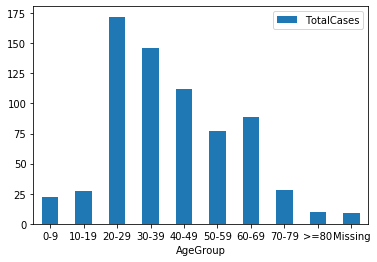

In [3]:
# Question 1 - Most affected age group
# Approach: 
#     - The index corresponding to the maximum 'Total Cases' is found
#     - The Age group correspoinding to this index is reported.


indx_maxAgeGroup = AgeGroup['TotalCases'].idxmax()
AgeGroupPlot = AgeGroup.plot.bar(x='AgeGroup', y='TotalCases', rot=0)
print('Age Group with maximum cases is {} with {} cases, constituting {} of total cases'.format(AgeGroup['AgeGroup'][indx_maxAgeGroup],AgeGroup['TotalCases'][indx_maxAgeGroup],AgeGroup['Percentage'][indx_maxAgeGroup]))

In [4]:
# Reformatting the data in CovidIndia (to enable functions using date)

CovidIndia['Date'] = pd.to_datetime(CovidIndia['Date'], format='%d/%m/%y')
CovidIndia = CovidIndia[['Date','State/UnionTerritory','Cured','Deaths','Confirmed']]

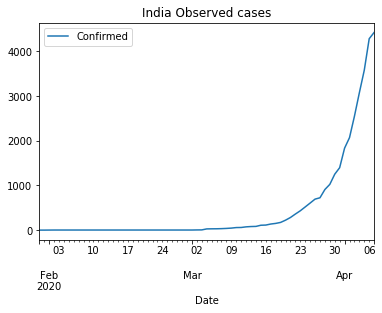

In [5]:
# Question 2 - Observed Cases or Confirmed Cases
# Plot of country-wide observed cases across time


graph = CovidIndia.groupby('Date')[['Cured', 'Deaths', 'Confirmed']].sum().reset_index()
observed_cases_plot = graph.plot(x = 'Date', y = 'Confirmed', title = "India Observed cases")

In [6]:
# Question 2 - Observed Cases or Confirmed Cases
# Plot of country-wide observed cases (stacked State wise) across time


spread = CovidIndia.groupby(['Date', 'State/UnionTerritory'])['Confirmed'].sum().reset_index().sort_values('Date', ascending=True).sort_values('Confirmed', ascending=True)
fig = px.area(spread, x="Date", y="Confirmed",color='State/UnionTerritory',title='Pan India State Wise Confirmed over time',height=500,
              color_discrete_sequence = px.colors.cyclical.Edge)
fig.update_layout(plot_bgcolor='rgb(275, 270, 273)',width=700, height=600)

In [7]:
# Question 2 - Observed Cases or Confirmed Cases
# Plot of State wise observed cases across time


spread = spread.sort_values('Date', ascending=True)
fig = px.line(spread, x="Date", y="Confirmed",color='State/UnionTerritory',title='State Wise Confirmed over time',height=500,
              color_discrete_sequence = px.colors.cyclical.HSV)
fig.update_layout(plot_bgcolor='rgb(275, 270, 273)',width=700, height=600)

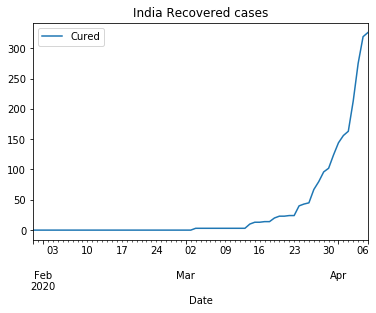

In [8]:
# Question 2 - Recovered Cases or Cured Cases
# Plot of country-wide recovered cases across time


graph = CovidIndia.groupby('Date')[['Cured', 'Deaths', 'Confirmed']].sum().reset_index()
recovered_cases_plot = graph.plot(x = 'Date', y = 'Cured', title = "India Recovered cases")

In [9]:
# Question 2 - Recovered Cases or Cured Cases
# Plot of country-wide recovered cases (stacked State wise) across time


spread = CovidIndia.groupby(['Date', 'State/UnionTerritory'])['Cured'].sum().reset_index().sort_values('Date', ascending=True)
fig = px.area(spread, x="Date", y="Cured",color='State/UnionTerritory',title='Pan India State Wise Recovered over time',height=500,
              color_discrete_sequence = px.colors.cyclical.Edge)
fig.update_layout(plot_bgcolor='rgb(275, 270, 273)',width=700, height=600)

In [10]:
# Question 2 - Recovered Cases or Cured Cases
# Plot of State wise recovered cases across time


spread = CovidIndia.groupby(['Date', 'State/UnionTerritory'])['Cured'].sum().reset_index().sort_values('Date', ascending=True)
fig = px.line(spread, x="Date", y="Cured",color='State/UnionTerritory',title='State Wise Recovered over time',height=500,
              color_discrete_sequence = px.colors.cyclical.HSV)
fig.update_layout(plot_bgcolor='rgb(275, 270, 273)',width=700, height=600)

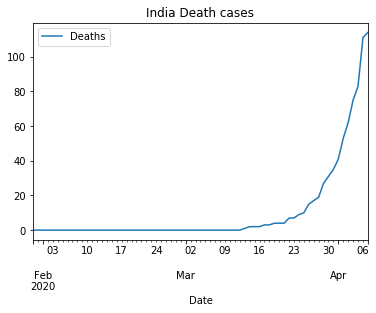

In [11]:
# Question 2 - Deaths or Lost cases
# Plot of country-wide deaths across time


graph = CovidIndia.groupby('Date')[['Cured', 'Deaths', 'Confirmed']].sum().reset_index()
lost_cases_plot = graph.plot(x = 'Date', y = 'Deaths', title = "India Death cases")

In [12]:
# Question 2 - Deaths or Lost cases
# Plot of country-wide deaths (stacked State wise) across time


spread = CovidIndia.groupby(['Date', 'State/UnionTerritory'])['Deaths'].sum().reset_index().sort_values('Date', ascending=True)
fig = px.area(spread, x="Date", y="Deaths",color='State/UnionTerritory',title='Pan India State Wise Death over time',height=500,
              color_discrete_sequence = px.colors.cyclical.Edge)
fig.update_layout(plot_bgcolor='rgb(275, 270, 273)',width=700, height=600)

In [13]:
# Question 2 - Deaths or Lost cases
# Plot of State wise deaths across time


fig = px.line(spread, x="Date", y="Deaths",color='State/UnionTerritory',title='State Wise Deaths over time',height=500,
              color_discrete_sequence = px.colors.cyclical.HSV)
fig.update_layout(plot_bgcolor='rgb(275, 270, 273)',width=700, height=600)

In [14]:
# Reformatting the data in PopulationCensus (convert Density of type object(str) to type float)

if PopulationCensus['Density'].dtypes == np.object:
    PopulationCensus['Density'] = PopulationCensus["Density"].str.split("/").str[0]
    PopulationCensus['Density'] = PopulationCensus['Density'].str.replace(",", "").astype(float)
# DensityPlot = PopulationCensus.plot.bar(x='State / Union Territory', y='Density')

In [31]:
# Question 3 - Intensity of virus spread (state level)
# Plot of State wise virus spread intensity across time


PopDensity = dict(zip(PopulationCensus['State / Union Territory'],PopulationCensus['Density']))
PopDensity['Telangana'] = PopDensity['Telengana']
positives = StatewiseTestingData.sort_values(by='Date', ascending=False)[['Date', 'State', 'Positive']]
positives = positives.dropna().sort_values('State')
Intensity_dict = {}
# It has been noted that Nagaland has no cases. Hence, the graph is blank.
for i in positives['State'].unique():
    statewise = positives[positives['State'] == i].copy()
    statewise['Intensity'] = statewise['Positive']/PopDensity[i]
    statewise = statewise.sort_values('Date')
#     intensityplot = statewise.plot.bar(x='Date', y='Intensity', title = "Intensity in {} state".format(i))
    Intensity_dict[i]=max(statewise['Intensity'])
    statewise['Date'] = pd.to_datetime(statewise['Date'], format="%Y/%m/%d")
    statewise['Date'] = statewise['Date'].apply(lambda x: x.strftime("%Y/%m/%d"))
    data = px.data.gapminder()
    fig = px.bar(statewise, x='Date', y='Intensity',
                 color='Intensity', title="Intensity in {} state".format(i))
    fig.show()
    

In [48]:
PopulationCensus['State / Union Territory'].unique()

array(['Uttar Pradesh', 'Maharashtra', 'Bihar', 'West Bengal',
       'Madhya Pradesh', 'Tamil Nadu', 'Rajasthan', 'Karnataka',
       'Gujarat', 'Andhra Pradesh', 'Odisha', 'Telengana', 'Kerala',
       'Jharkhand', 'Assam', 'Punjab', 'Chhattisgarh', 'Haryana',
       'Uttarakhand', 'Himachal Pradesh', 'Tripura', 'Meghalaya',
       'Manipur', 'Nagaland', 'Goa', 'Arunachal Pradesh', 'Mizoram',
       'Sikkim', 'Delhi', 'Jammu and Kashmir', 'Puducherry', 'Chandigarh',
       'Dadra and Nagar Haveli and Daman and Diu',
       'Andaman and Nicobar Islands', 'Ladakh', 'Lakshadweep'],
      dtype=object)

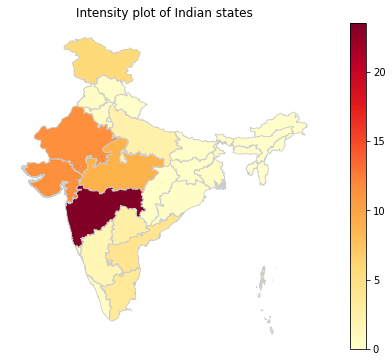

In [56]:
Intensity_df = pd.DataFrame(Intensity_dict.items())
Intensity_df.columns = ['State / Union Territory','Intensity']
fp = "Igismap/Indian_States.shp"
map_df = gpd.read_file(fp)
map_df['st_nm'][0] = 'Andaman and Nicobar Islands'
map_df['st_nm'][1] = 'Arunachal Pradesh'
map_df['st_nm'][12] = 'Jammu and Kashmir'
map_df['st_nm'][23] = 'Delhi'
Intensity_map_visualized = map_df.set_index('st_nm').join(Intensity_df.set_index('State / Union Territory'))
fig, ax = plt.subplots(1, figsize=(10, 6))
ax.axis('off')
ax.set_title('Intensity plot of Indian states')
Intensity_map_visualized.plot(column='Intensity', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

The hotspots as of April 10 (based on week 3/4/20 to 10/4/20) are:
Adilabad, Agra, Ahmedabad, Akola, Anantapur, Aurangabad, Banswara, Baramulla, Barwani, Bengaluru Urban, Bhavnagar, Bhopal, Bikaner, Chengalpattu, Chennai, Chittoor, Coimbatore, Cuddalore, Dindigul, Erode, Evacuees*, Faridabad, Gautam Buddha Nagar, Ghaziabad, Guntur, Gurugram, Hyderabad, Indore, Italians*, Jaipur, Jaisalmer, Jammu, Jhalawar, Jhunjhunu, Jodhpur, Jogulamba Gadwal, Kamareddy, Kannur, Kanyakumari, Karimnagar, Kasaragod, Khargone, Khordha, Kota, Krishna, Kupwara, Kurnool, Lucknow, Madurai, Mahabubnagar, Mansa, Meerut, Mumbai, Mysuru, Nalgonda, Namakkal, Nirmal, Nizamabad, Nuh, Palghar, Palwal, Patan, Pathanamthitta, Pathankot, Prakasam, Pune, Ranipet, S.A.S. Nagar, S.P.S. Nellore, Shamli, Shopiyan, Sitapur, Siwan, Srinagar, Surat, Thane, Thanjavur, Theni, Thiruvallur, Thoothukkudi, Tiruchirappalli, Tirunelveli, Tiruppur, Tonk, Udhampur, Vadodara, Vellore, Viluppuram, Y.S.R. Kadapa


/home/kamesh-k/.local/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



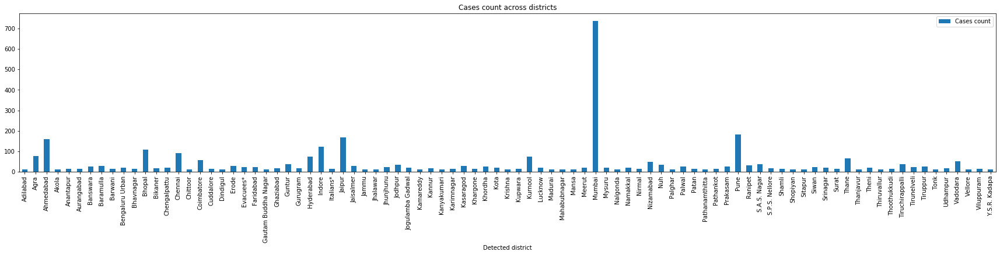

In [16]:
# Question 4 - Hotspots as on 10/4/20 
# Week based approach has been used to identify hotspots
# Approach:
#     - District wise count of number of positive patients 
#       was taken from IndivudualDetails between the dates
#       03/04/2020 and 10/04/2020


start_date = '03/04/2020'
end_date = '10/04/2020'

April10 = IndividualDetails.copy()
April10 = April10[(April10['diagnosed_date'] <= end_date) & (April10['diagnosed_date'] > start_date)]

April10 = April10[['id', 'detected_district']]
April10 = April10.groupby('detected_district').count().reset_index()
April10 = April10[April10['id'] >= 10]

April10 = April10.rename(columns={'detected_district':'Detected district', 'id':'Cases count'})
April10_week_plot = April10.plot.bar(x='Detected district', y='Cases count', title='Cases count across districts', figsize=(30,5))

hotspot_april10_list = April10['Detected district'].tolist()
print("The hotspots as of April 10 (based on week 3/4/20 to 10/4/20) are:")
for i in hotspot_april10_list[:-1]:
    print(i, end=", ")
print(hotspot_april10_list[-1])

April10['Cases count'].iloc[21] = April10['Cases count'].iloc[21] + April10['Cases count'].iloc[22]
April10 = April10.dropna()
April10 = April10[April10['Detected district'] != 'Bandipore']
April10 = April10[~April10['Detected district'].str.contains('\*', regex=True)]

April10['Detected district'].iloc[66] = 'Sri Potti Sriramulu Nellore District'
April10['Detected district'].iloc[69] = 'Nawanshahr'
April10['Detected district'].iloc[68] = 'Shopian'
hotspot_april10_list = April10['Detected district'].tolist()

In [17]:
# # Latitude-longitude values for hotspot visualization
# # Commented as it takes a long time to execute

# from  geopy.geocoders import Nominatim
# geolocator = Nominatim(user_agent="my-application")

# print("City \t\t Latitude \t Longitude \t Count")
# n = len(hotspot_april10_list)

# if n%2 == 1:
#     for i,j in zip(hotspot_april10_list[:(n+1)//2], April10['Cases count'].iloc[:(n+1)//2]):
#         city = i
#         country = "India"
#         loc = geolocator.geocode(city+','+ country)
#         print(i, "\t", loc.latitude, "\t", loc.longitude, "\t", j)

#     for i,j in zip(hotspot_april10_list[(n+1)//2:n], April10['Cases count'].iloc[(n+1)//2:n]):
#         city = i
#         country = "India"
#         loc = geolocator.geocode(city+','+ country)
#         print(i, "\t", loc.latitude, "\t", loc.longitude, "\t", j)
# else:
#     for i,j in zip(hotspot_april10_list[:n//2], April10['Cases count'].iloc[:n//2]):
#         city = i
#         country = "India"
#         loc = geolocator.geocode(city+','+ country)
#         print(i, "\t", loc.latitude, "\t", loc.longitude, "\t", j)

#     for i,j in zip(hotspot_april10_list[n//2:n], April10['Cases count'].iloc[n//2:n]):
#         city = i
#         country = "India"
#         loc = geolocator.geocode(city+','+ country)
#         print(i, "\t", loc.latitude, "\t", loc.longitude, "\t", j)

The hotspots as of April 10 (based on the day 10/4/20) are:
Ahmedabad, Banswara, Bhopal, Chengalpattu, Coimbatore, Indore, Jaipur, Mumbai, Pune, S.A.S. Nagar, Thane, Udhampur, Vadodara


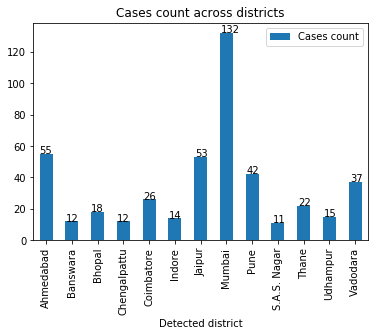

In [18]:
# Question 4 - Hotspots as on 10/04/20 
# Day based approach has been used to identify hotspots
# Approach:
#     - District wise count of number of positive patients 
#       was taken from IndivudualDetails on 10/04/20


April10 = IndividualDetails.copy()
April10 = April10[(April10['diagnosed_date'] == '10/04/2020')]

April10 = April10[['id', 'detected_district']]
April10 = April10.groupby('detected_district').count().reset_index()


April10 = April10[April10['id'] >= 10]
April10 = April10.rename(columns={'detected_district':'Detected district', 'id':'Cases count'})
April10_day_plot = April10.plot.bar(x='Detected district', y='Cases count', title='Cases count across districts')
for p in April10_day_plot.patches:
    April10_day_plot.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

hotspot_april10_list = April10['Detected district'].tolist()
print("The hotspots as of April 10 (based on the day 10/4/20) are:")
for i in hotspot_april10_list[:-1]:
    print(i, end=", ")
print(hotspot_april10_list[-1])

In [19]:
# Latitude-longitude values for hotspot visualization

# from  geopy.geocoders import Nominatim
# geolocator = Nominatim(user_agent="my-application")

# for i,j in zip(hotspot_april10_list, April10['Cases count']):
#     city = i
#     country = "India"
#     loc = geolocator.geocode(city+','+ country)

#     print(i, "\t", loc.latitude, "\t", loc.longitude, "\t", j)

In [69]:
# Question 5 - States with maximum change in hotspots
# on a weekly basis from 20/03/20 to 10/04/20.
# Approach:
#     - District wise count of number of positive patients 
#       was taken from IndivudualDetails.
#     - All districts with greater than 10 cases on each week
#       were designated as hotspots.
#     - Week ID is used in this question. It returns the week 
#       number of that particular week in the year 
#       (20/3 and 21/3; Week ID = 12
#        22/3 - 28/3; Week ID = 13
#        29/3 - 04/4; Week ID = 14
#        05/4 - 11/4; Week ID = 15)


DistrictWise = IndividualDetails.groupby('detected_district')['id'].count().reset_index()
HotSpotCities = DistrictWise[DistrictWise['id']>=10].sort_values('id',ascending=False)
IndividualDetails['diagnosed_date'] = pd.to_datetime(IndividualDetails['diagnosed_date'], format='%d/%m/%Y')

w1_sd = pd.to_datetime('20-03-2020', format='%d-%m-%Y')
w1_ed = pd.to_datetime('27-03-2020', format='%d-%m-%Y')
w2_sd = pd.to_datetime('27-03-2020', format='%d-%m-%Y')
w2_ed = pd.to_datetime('3-04-2020', format='%d-%m-%Y')
w3_sd = pd.to_datetime('3-04-2020', format='%d-%m-%Y')
w3_ed = pd.to_datetime('10-04-2020', format='%d-%m-%Y')

def assign_week_id(x):
    if x >= w1_sd and x < w1_ed:
        week = 1
    elif x >= w2_sd and x < w2_ed:
        week = 2
    elif x >= w3_sd and x < w3_ed:
        week = 3
    else: week = np.nan
    return week

last_3_weeks = IndividualDetails.copy()
last_3_weeks['Week ID'] = last_3_weeks['diagnosed_date'].apply(assign_week_id)
last_3_weeks = last_3_weeks[~pd.isnull(last_3_weeks['Week ID'])]
hotspot_count = last_3_weeks.groupby(['Week ID','detected_district','detected_state'])['id'].count().reset_index()

hotspot_count = hotspot_count[hotspot_count['id']>=10].sort_values('Week ID',ascending=True)
hotspot_count = hotspot_count.groupby(['detected_state', 'Week ID']).count()

In [70]:
hotspot_count

detected_district  id
detected_state    Week ID                       
Andhra Pradesh    2.0                      6   6
                  3.0                      8   8
Bihar             3.0                      1   1
Chandigarh        2.0                      1   1
Delhi             2.0                      1   1
Gujarat           1.0                      1   1
                  2.0                      1   1
                  3.0                      5   5
Haryana           3.0                      4   4
Jammu and Kashmir 2.0                      2   2
                  3.0                      6   6
Karnataka         1.0                      1   1
                  2.0                      3   3
                  3.0                      3   3
Kerala            1.0                      3   3
                  2.0                      2   2
                  3.0                      2   2
Madhya Pradesh    2.0                      1   1
                  3.0                      5   5
Maharashtra       1.0                      2   2
                  2.0                      6   6
                  3.0                      4   4
Odisha            3.0                      1   1
Punjab            1.0                      1   1
                  3.0                      2   2
Rajasthan         1.0                      1   1
                  2.0                      2   2
                  3.0                      9   9
Tamil Nadu        1.0                      1   1
                  2.0                     12  12
                  3.0                     18  18
Telangana         1.0                      1   1
                  2.0                      1   1
                  3.0                     10  10
Uttar Pradesh     1.0                      1   1
                  2.0                      2   2
                  3.0                      9   9
Uttarakhand       3.0                      1   1

In [72]:
hotspot_count = hotspot_count.groupby(['Week ID','detected_state']).sum().reset_index()

states = ['Kerala', 'Delhi', 'Telengana', 'Rajasthan', 'Uttar Pradesh',
       'Haryana', 'Ladakh', 'Tamil Nadu', 'Punjab', 'Maharashtra',
       'Karnataka', 'Jammu and Kashmir', 'Andhra Pradesh', 'Uttarakhand',
       'Odisha', 'West Bengal', 'Puducherry', 'Chhattisgarh',
       'Chandigarh', 'Gujarat', 'Madhya Pradesh', 'Himachal Pradesh',
       'Bihar', 'Manipur', 'Mizoram', 'Andaman and Nicobar Islands',
       'Goa', 'Unassigned', 'Assam', 'Jharkhand', 'Arunachal Pradesh',
       'Tripura']

values = {}
for state in states:
    count = hotspot_count[hotspot_count['detected_state'] == state]
    if np.prod(count.shape) > 0:
        min_idx = np.argmin(count['Week ID'].values)
        for i, j in zip(count['Week ID'].values, count['id'].values):
            if i == count['Week ID'].values[min_idx]:
                values[state] = {}
                values[state][i] = j - count['id'].values[min_idx]
            else:
                values[state][i] = j - count['id'].values[min_idx]
            
                    
HotSpots_3Weeks = pd.DataFrame(values)
HotSpots_3Weeks = HotSpots_3Weeks.T
HotSpots_3Weeks = HotSpots_3Weeks.fillna(0)
# Column 1.0 represents the base or reference level 
HotSpots_3Weeks

,1.0,2.0,3.0
Kerala,0.0,-1.0,-1.0
Delhi,0.0,0.0,0.0
Rajasthan,0.0,1.0,8.0
Uttar Pradesh,0.0,1.0,8.0
Haryana,0.0,0.0,0.0
Tamil Nadu,0.0,11.0,17.0
Punjab,0.0,0.0,1.0
Maharashtra,0.0,4.0,2.0
Karnataka,0.0,2.0,2.0
Jammu and Kashmir,0.0,0.0,4.0


/home/kamesh-k/.local/lib/python3.7/site-packages/pandas/core/strings.py:1952: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



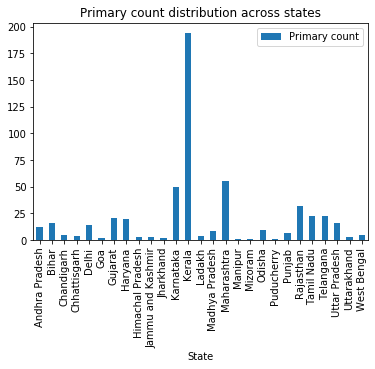

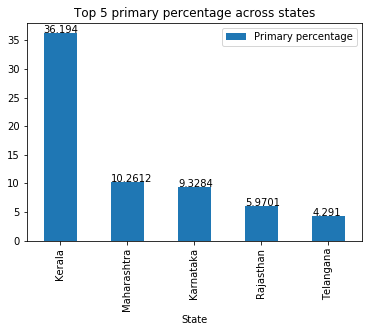

In [22]:
# Question 6 - Classification into Primary, Secondry and Tertiary cases
# Primary Cases


primary_details = IndividualDetails.copy()
primary_details = primary_details[primary_details['diagnosed_date'] <= '10/04/2020'][['id', 'notes', 'detected_state']]
primary_details = primary_details.dropna()

travelled_flag = (primary_details['notes'].str.contains("Travelled from"))
travelled_in_flag = (primary_details['notes'].str.contains("Travelled ((from|to) Delhi)|((from|to) Bangalore)|((from|to) Rajasthan)|((from|to) Kolkata)|((from|to) Mumbai)|((from|to) WB) | ((from|to)(Phuket)) | (MP)", regex=True))
travelled_id = primary_details[travelled_flag]['id']
travelled_in_id = primary_details[travelled_in_flag]['id']
primary_flag = travelled_flag & (~travelled_in_flag)


primary_details = primary_details[primary_flag][['id', 'detected_state']].groupby('detected_state').count().reset_index()

primary_id = primary_details['id']
primary_details = primary_details.rename(columns={'id':'Primary count', 'detected_state':'State'})

primary_details_plot = primary_details.plot.bar(x='State', y='Primary count', title='Primary count distribution across states')

primary_details = primary_details.sort_values(by='State')

tot_pri = np.sum(primary_details['Primary count'].to_numpy())
primary_details['Primary percentage'] = 100*primary_details['Primary count']/tot_pri
top5_pri = primary_details.sort_values(by='Primary percentage', ascending=False).head(5)
top5_pri_plot = top5_pri.plot.bar(y='Primary percentage', x='State', title='Top 5 primary percentage across states')

# for annotation of bar graph
for p in top5_pri_plot.patches:
    top5_pri_plot.annotate(str(round(p.get_height(), 4)), (p.get_x() * 1.005, p.get_height() * 1.005))
    

total_pri_fig = px.pie(primary_details, values='Primary count', names='State', title='Primary count distribution') 
total_pri_fig.show()


fig = px.pie(top5_pri, values='Primary percentage', names='State',
             title='Top 5 states - primary percentage')
fig.update_traces(textposition='inside', textinfo='value+label')
fig.show()

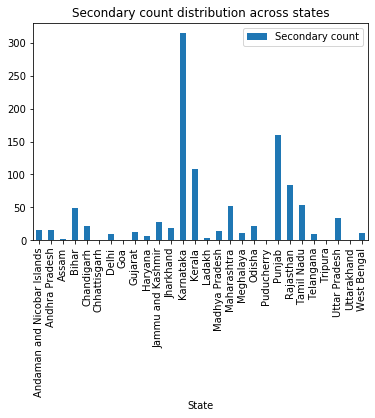

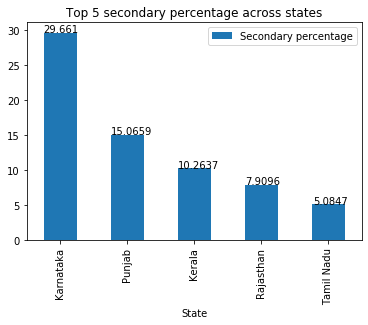

In [23]:
# Question 6 - Classification into Primary, Secondry and Tertiary cases
# Secondry Cases

secondary_details = IndividualDetails.copy()
secondary_details = secondary_details[secondary_details['diagnosed_date'] <= '10/04/2020'][['id', 'notes', 'detected_state']]
secondary_details = secondary_details.dropna()

secondary_details.head()

contact_flag = (secondary_details['notes'].str.contains("Contact", case=False))
patient_id_flag = (secondary_details['notes'].str.contains("(P\d+?)", regex=True))
hospitals_flag = (secondary_details['notes'].str.contains("(Doctor)|(Hospital)", regex=True, case=False))
family_flag = (secondary_details['notes'].str.contains("Family", regex=True, case=False))
nri_flag = (secondary_details['notes'].str.contains("NRI"))
positive_patient_flag = (secondary_details['notes'].str.contains("(Patient)|(Positive)", case=False))
secondary_flag = (contact_flag | patient_id_flag | positive_patient_flag | hospitals_flag | nri_flag | family_flag) & (~primary_flag)


secondary_details = secondary_details[secondary_flag][['id', 'detected_state']].groupby('detected_state').count().reset_index()
secondary_id = secondary_details['id']

secondary_details = secondary_details.rename(columns={'id':'Secondary count', 'detected_state':'State'})
secondary_details_plot = secondary_details.plot.bar(x='State', y='Secondary count', title='Secondary count distribution across states')

secondary_details = secondary_details.sort_values(by='State')

tot_sec = np.sum(secondary_details['Secondary count'].to_numpy())
secondary_details['Secondary percentage'] = 100*secondary_details['Secondary count']/tot_sec
top5_sec = secondary_details.sort_values(by='Secondary percentage', ascending=False).head(5)
top5_sec_plot = top5_sec.plot.bar(y='Secondary percentage', x='State', title='Top 5 secondary percentage across states')

# for annotation of bar graph
for p in top5_sec_plot.patches:
    top5_sec_plot.annotate(str(round(p.get_height(), 4)), (p.get_x() * 1.005, p.get_height() * 1.005))


total_sec_fig = px.pie(secondary_details, values='Secondary count', names='State', title='Secondary count distribution') 
total_sec_fig.show()

# fig = go.Figure(data=[go.Pie(labels = top5_sec['State'], values = top5_sec['Secondary percentage'], textinfo='label+percent',
#                              insidetextorientation='radial', title='Top 5 states - secondary percentage')])
# fig.show()


fig = px.pie(top5_sec, values='Secondary percentage', names='State',
             title='Top 5 states - secondary percentage')
fig.update_traces(textposition='inside', textinfo='value+label')
fig.show()

/home/kamesh-k/anaconda3/envs/ML/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



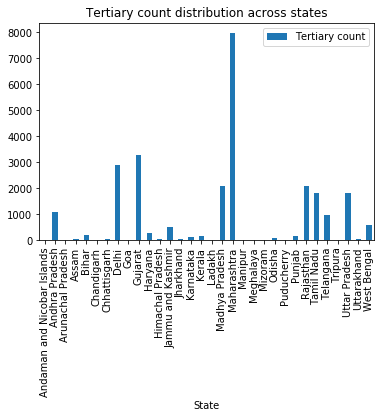

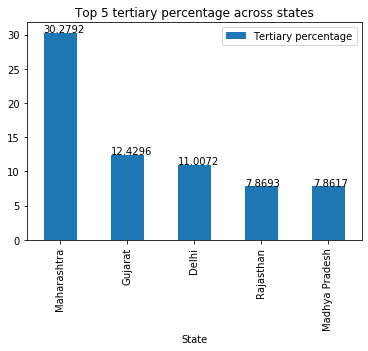

In [24]:
# Question 6 - Classification into Primary, Secondry and Tertiary cases
# Tertiary Cases


tertiary_details = IndividualDetails.copy()
tertiary_details = tertiary_details.groupby('detected_state').count().reset_index()
tertiary_details = tertiary_details[['id', 'detected_state']]
tertiary_details = tertiary_details.rename(columns={'id':'Total count', 'detected_state':'State'})

tertiary_details = pd.merge(tertiary_details, primary_details, how='left', left_on='State', right_on='State')
tertiary_details = pd.merge(tertiary_details, secondary_details, how='left', left_on='State', right_on='State')

tertiary_details = tertiary_details.fillna(0)
tertiary_details['Tertiary count'] = tertiary_details['Total count'] - tertiary_details['Primary count'] - tertiary_details['Secondary count']

tertiary_details_plot = tertiary_details.plot.bar(x='State', y='Tertiary count', title='Tertiary count distribution across states')
tertiary_details = tertiary_details[['State', 'Tertiary count']]

tot_ter = np.sum(tertiary_details['Tertiary count'].to_numpy())
tertiary_details['Tertiary percentage'] = 100*tertiary_details['Tertiary count']/tot_ter
top5_ter = tertiary_details.sort_values(by='Tertiary percentage', ascending=False).head(5)
top5_ter_plot = top5_ter.plot.bar(y='Tertiary percentage', x='State', title='Top 5 tertiary percentage across states')

# for annotation of bar graph
for p in top5_ter_plot.patches:
    top5_ter_plot.annotate(str(round(p.get_height(), 4)), (p.get_x() * 1.005, p.get_height() * 1.005))


total_ter_fig = px.pie(tertiary_details, values='Tertiary count', names='State', title='Tertiary count distribution') 
total_ter_fig.show()

fig = px.pie(top5_ter, values='Tertiary percentage', names='State',
             title='Top 5 states - tertiary percentage')
fig.update_traces(textposition='inside', textinfo='value+label')
fig.show()

Assuming that total positive cases compound by 10%
Number of additional testing centers required (as of 20th April): 286


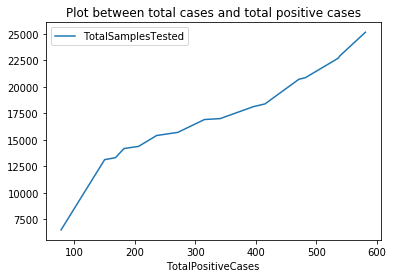

In [25]:
# Question 7 - Predict the number of additional labs required
# Correlation between the Total cases and positive cases.
#
# Approach1: Positive cases were assumed to increase by 10% 
#   - The total positive cases was plotted against the total tested cases
#     and the possible relation between the two were analysed.
#     Barring the first four days, the relation between the two were found
#     to be linear.
#   - The parameters for the linear fit were found using the numpy polyfit function
#   - The future positive cases were built on the last positive case count data available
#     and the count was compounded by 10% as in the question
#   - Using the linear fit parameters returned, the future total cases were also estimated
#   - The required number of testing centers were found using the future total cases


testing_details = ICMRTesting.copy()
(c, d) = np.polyfit(testing_details['TotalPositiveCases'].iloc[4:], testing_details['TotalSamplesTested'].iloc[4:], 1)
# total_samples = c*total_positives + d

positives_plot = testing_details.plot(x='TotalPositiveCases', y='TotalSamplesTested', title='Plot between total cases and total positive cases')


future_positives = [testing_details['TotalPositiveCases'].iloc[-1].astype(int)]
for i in range(11):
    future_positives.append(round(future_positives[-1]*1.1).astype(int))
    
future_positives = np.array(future_positives)
future_total = c*future_positives + d

# future_positives = np.concatenate((testing_details['TotalPositiveCases'].to_numpy(), future_positives))
# future_total = np.concatenate((testing_details['TotalSamplesTested'].to_numpy(), future_total))

no_of_testing_centers = np.ceil(future_total/100).astype(int)
print("Assuming that total positive cases compound by 10%")
print("Number of additional testing centers required (as of 20th April):", no_of_testing_centers[-1] - no_of_testing_centers[0])

In [26]:
# Question 7 - Predict the number of additional labs required
#
# Approach2: Total cases were assumed to increase by 10% 
#   - The future total cases were built on the last total case count data available
#     and the count was compounded by 10% as in the question
#   - The required number of testing centers were found using the future total cases

future_total = [testing_details['TotalSamplesTested'].iloc[-1].astype(int)]
for i in range(11):
    future_total.append(round(future_total[-1]*1.1).astype(int))

future_total = np.array(future_total)
no_of_testing_centers = np.ceil(future_total/100).astype(int)
print("Assuming that total tested cases compound by 10%")
print("Number of additional testing centers required (as of 20th April):", no_of_testing_centers[-1] - no_of_testing_centers[0])

Assuming that total tested cases compound by 10%
Number of additional testing centers required (as of 20th April): 466


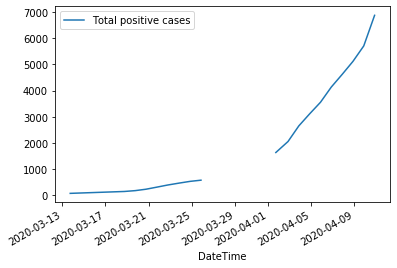

In [27]:
# Question 8 - The notion of flattening the curve

testing_details = ICMRTesting.copy()
testing_details['DateTime'] = pd.to_datetime(testing_details['DateTime'])
testing_details = testing_details.rename(columns={'TotalPositiveCases':'Total positive cases'})
positives = testing_details['Total positive cases'].to_numpy().astype(int)

# Mirroring the positives - ensuring smallest spread
# low = np.concatenate((positives, np.flip(positives)))

# plt.figure()
# plt.plot(low)
# s = np.std(low)
# m = np.mean(low)
# norm.pdf(low,m,s)*s + m


testing_details_new = ICMRTestingNew.copy()
testing_details_new['DateTime'] = pd.to_datetime(testing_details_new['DateTime'], format='%d/%m/%y %H:%M')
flag = ((testing_details_new['DateTime'] >= '03/01/2020 00:00') & (testing_details_new['DateTime'] <= pd.to_datetime('04/10/2020 23:59')))

testing_details_new = testing_details_new[flag]
testing_details_new = testing_details_new.rename(columns={'TotalPositiveCases':'Total positive cases'})
testing_details_new_plot = testing_details_new.plot(x='DateTime', y='Total positive cases')

testing_details_new['Time duration'] = pd.to_datetime(testing_details_new['DateTime'][0])
testing_details_new['Time duration'] = (testing_details_new['DateTime'] - testing_details_new['Time duration']).dt.days
testing_details_new['Time duration'] = (testing_details_new['Time duration'] + (testing_details_new['DateTime'].dt.hour/24).astype(float))

In [74]:
# SEIR model to explain flattening the curve
# Integration using odeint

from scipy.integrate import odeint

def get_derivatives(y, t, total_population, beta, sigma, gamma):
    s, e, i, r = y

    dsdt = -beta*s*i/total_population
    dedt = beta*s*i/total_population - sigma*e
    didt = sigma*e - gamma*i
    drdt = gamma*i

    return dsdt, dedt, didt, drdt


# Incubation periods - sigma = 1/5
# https://www.mohfw.gov.in/pdf/DGSOrder04of2020.pdf
# https://www.who.int/docs/default-source/coronaviruse/situation-reports/20200402-sitrep-73-covid-19.pdf

# Recovery duration calculation
recovered = IndividualDetails.copy()
recovered = recovered[recovered['current_status'] == 'Recovered']
recovered['status_change_date'] = pd.to_datetime(recovered['status_change_date'], format='%d/%m/%Y')
recovered['duration'] = recovered['status_change_date'] - recovered['diagnosed_date']
recovered = recovered.dropna()
recovered = recovered[recovered['duration'].dt.days> 0]
avg_recovery_time = recovered['duration'].dt.days.mean()


beta_list = [0.1, 0.25, 0.5, 1, 5, 10]
sigma = 1/6
gamma = 1/avg_recovery_time

dt = 0.1
t_max = 900
time_duration = int(np.ceil(t_max//dt))
time = np.linspace(0, t_max, time_duration)
total_population = 135.26*10**7

fig = go.Figure()
for beta in beta_list:
    y0 = [total_population, 0, 3, 0]
    sol = odeint(get_derivatives, y0, time, args=(total_population, beta, sigma, gamma))

    i_list = sol[:,2]
    
    string = 'beta value: ' + str(beta)
    fig.add_trace(go.Scatter(x=time*dt, y=i_list, hovertext=string, name=string))

# https://www.who.int/gho/health_workforce/physicians_density/en/
# medical_limitations = 0.6*10**-3*total_population*np.ones(np.size(time))

# Considering teh total number of hospital beds as the medical limitation
HospitalBeds['NumPublicBeds_HMIS'] = HospitalBeds['NumPublicBeds_HMIS'].str.replace(',', '')
values = HospitalBeds['NumPublicBeds_HMIS'].copy()
values = values.dropna().astype(float)
medical_limitations = values.sum()*np.ones(np.size(time))

fig.add_trace(go.Scatter(x=time*dt, y=medical_limitations, name="India's medical limitation", line=dict(dash='dash')))
fig.update_layout(title_text="Infected population distribution across time - the notion of flattening the curve")
fig.update_layout(yaxis_title="Population", xaxis_title="Days")
fig.show()

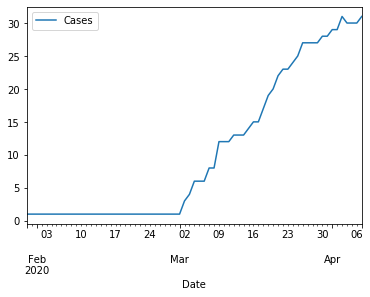

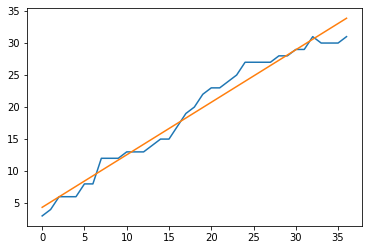

In [75]:
# Question 9 - Effect of the lockdown

covid_data = CovidIndia.copy()
covid_data['Date'] = pd.to_datetime(covid_data['Date'], format='%d/%m/%y')

covid_data = covid_data.groupby('Date').count().reset_index()
covid_data = covid_data[['Date', 'Confirmed']]
covid_data = covid_data.rename(columns={'Confirmed':'Cases'})
covid_data_plot = covid_data.plot(x='Date', y='Cases')

covid_data['Time duration'] = covid_data['Date'].iloc[32]
covid_data = covid_data.iloc[32:]
covid_data['Time duration'] = (covid_data['Date'] - covid_data['Time duration']).dt.days


covid_data.head(45)
(m, c) = np.polyfit(covid_data['Time duration'], covid_data['Cases'], 1)

plt.figure()
plt.plot(covid_data['Time duration'], covid_data['Cases'])
plt.plot(covid_data['Time duration'], covid_data['Time duration']*m + c)
plt.show()